In [1]:
%config IPCompleter.greedy = True
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sn
import tensorflow as tf
import os
from datetime import datetime

import IPython.display as display
import matplotlib as mpl
import PIL.Image
import time
import functools

mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

# make results reproducible
seed = 0
np.random.seed(seed)
!pip install tensorflow_hub

# Nerual Style transfer

Neural Style Transfer (NST) refers to a class of software algorithms that manipulate digital images, or videos, to adopt the appearance or visual style of another image.

Neural style transfer is an optimization technique used to take two images—a *content* image and a *style reference* image (such as an artwork by a famous painter)—and blend them together so the output image looks like the content image, but “painted” in the style of the style reference image.

This is implemented by optimizing the output image to match the content statistics of the content image and the style statistics of the style reference image. These statistics are extracted from the images using a convolutional network.

[[1](https://www.tensorflow.org/tutorials/generative/style_transfer)]

## Architecture

The process of NST assumes an input image $p$ and an example style image $a$.

The image $p$ is fed through the ConvNet, and network activations are sampled at a late convolution layer of a pre-trained ConvNet, commonly the VGG-19. Let $C(p)$ be the resulting output sample, called the 'content' of the input $p$.

The style image $a$ is then fed through the same ConvNet, and network activations are sampled at the early to middle layers of the ConvNet.  These activations are encoded into a *Gramian matrix* representation, call it $S(a)$ to denote the *style* of $a$.

The goal of NST is to synthesize an output image $x$ that exhibits the content of $p$ applied with the style of $a$, i.e.  $C(x)=C(p)$ and $S(x)=S(a)$.

We then use gradient descent optomization to gradually update $x$ to minimize the loss function error:

$$\mathcal{L(x)} = || C(x)-C(p) ||_2 + k ||S(x)-S(a)||_2$$

The constant $k$ controls the level of the stylization effect.

## Training setup

Image $x$ is initially approximated by adding a small amount of white noise to input image $p$ and feeding it through the ConvNet.  Then we successively backpropagate this loss through the network with the ConvNet weights fixed in order to update the pixels of $x$.  After multiple epochs of training, an $x$ (hopefully) emerges that matches the style of $a$ and the content of $p$.

## Example in Keras

In [2]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)


def load_img(path_to_img):
    """
    load an image and limit its maximum dimension to 512 pixels.
    """
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img


def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
        plt.title(title)


# https://commons.wikimedia.org/wiki/File:Vassily_Kandinsky,_1913_-_Composition_7.jpg
style_path = tf.keras.utils.get_file(
    'kandinsky5.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

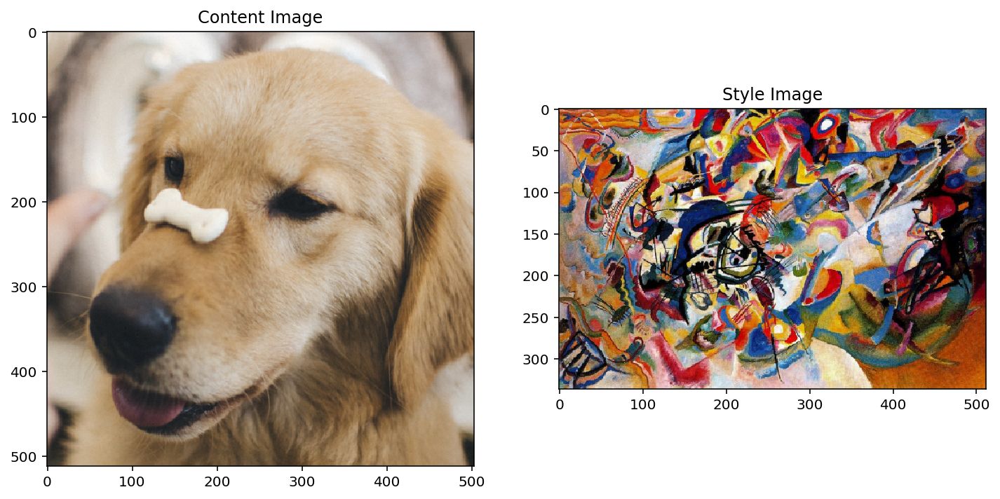

In [3]:
content_image = load_img('./dog.png')
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

## Fast Style Transfer using TensorFlow-Hub

Although we are covering the original neural style-transfer algorithm, which optimizes the image content to a particular style. There is also a more [recent variant](https://arxiv.org/abs/1705.06830), that was able to create a model for fast artistic style transfer that may operate in real time, however it is limited to one or a limited set of styles. Before getting into our implementation we can see how this variant performs. We can load it by using [TensorFlow Hub](https://tensorflow.org/hub).

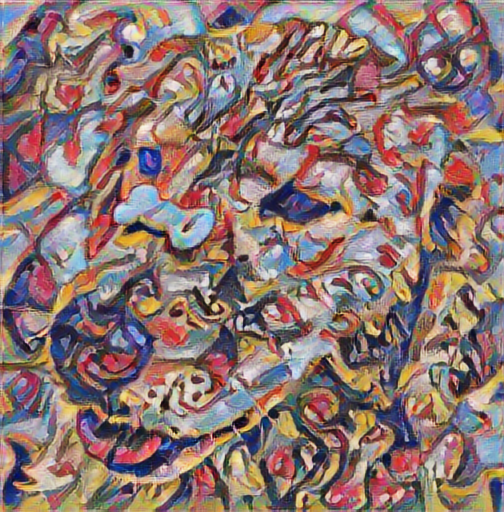

In [5]:
import tensorflow_hub as hub
hub_module = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

## Define content and style representations

We will use the intermediate layers of a pre-trained ImageNet model to get the *content* and *style* representations of the image. Starting from the network's input layer, the first few layer activations represent low-level features like edges and textures. As we step through the network, the final few layers represent higher-level features—object parts like *wheels* or *eyes*. Here we will use VGG19 ConvNet, a pre-trained image classification ConvNet. These intermediate layers are necessary to define the representation of content and style from the images. For the input image, we will attempt to match the corresponding style and content target representations at these intermediate layers.

We can load the [VGG19](https://keras.io/applications/#vgg19) pre-trained model and test run it on our image to ensure it's working correctly (i.e. we expect it to be able to classify our image).

In [8]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

TensorShape([1, 1000])

In [9]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(
    prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

[('golden_retriever', 0.95549417),
 ('tennis_ball', 0.011938266),
 ('Labrador_retriever', 0.011741317),
 ('Tibetan_mastiff', 0.003469969),
 ('soccer_ball', 0.002191962)]

Now we can load `VGG19` without the classification head, and list the layer names

In [14]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

vgg.summary()

print('\n\n\nLayer Names\n=========')
for layer in vgg.layers:
    print(layer.name)

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

We can choose intermediate layers from the network to represent the style and content of the image:


In [15]:
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

#### Intermediate layers for style and content

These intermediate outputs within our pre-trained image classification network allow us to define style and content representations, as in order for a network to perform image classification (which this network has been trained to do), it must understand the image. This requires taking the raw image as input pixels and building an internal representation that converts the raw image pixels into a complex understanding of the features present within the image.

This is also a reason why ConvNets are able to generalize well, they are able to capture the invariances and defining features within classes (e.g. cats vs. dogs) that are agnostic to background noise and other nuisances. Therefore somewhere between where the raw image is fed into the model and the output classification label, the model serves as a complex feature extractor. By accessing intermediate layers of the model, we are able to describe the content and style of input images.

## Building the model 

In [16]:
def vgg_layers(layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    # Load our model. Load pretrained VGG, trained on imagenet data
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    outputs = [vgg.get_layer(name).output for name in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

We can create the model

In [17]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

# Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
    print(name)
    print("  shape: ", output.numpy().shape)
    print("  min: ", output.numpy().min())
    print("  max: ", output.numpy().max())
    print("  mean: ", output.numpy().mean())
    print()

block1_conv1
  shape:  (1, 336, 512, 64)
  min:  0.0
  max:  835.5256
  mean:  33.97525

block2_conv1
  shape:  (1, 168, 256, 128)
  min:  0.0
  max:  4625.8857
  mean:  199.82687

block3_conv1
  shape:  (1, 84, 128, 256)
  min:  0.0
  max:  8789.239
  mean:  230.78099

block4_conv1
  shape:  (1, 42, 64, 512)
  min:  0.0
  max:  21566.135
  mean:  791.24005

block5_conv1
  shape:  (1, 21, 32, 512)
  min:  0.0
  max:  3189.2542
  mean:  59.179478



## Calculating style

The content of an image is represented by the values of the intermediate feature maps.

It turns out, the style of an image can be described by the means and correlations across the different feature maps. We can calculate a *Gram matrix* that includes this information by taking the outer product of the feature vector with itself at each location, and averaging that outer product over all locations. This Gram matrix can be calculated for a particular layer as:

$$G^l_{cd} = \frac{\sum_{ij} F^l_{ijc}(x)F^l_{ijd}(x)}{IJ}$$

This can be implemented concisely using the `tf.linalg.einsum` function:

In [21]:
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result/(num_locations)

## Extracting style and content


We create a model that returns the style and content tensors.

In [22]:
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        "Expects float input in [0,1]"
        inputs = inputs*255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(
            inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])

        style_outputs = [gram_matrix(style_output)
                         for style_output in style_outputs]

        content_dict = {content_name: value
                        for content_name, value
                        in zip(self.content_layers, content_outputs)}

        style_dict = {style_name: value
                      for style_name, value
                      in zip(self.style_layers, style_outputs)}

        return {'content': content_dict, 'style': style_dict}

When called on an image, this model returns the gram matrix (style) of the `style_layers` and content of the `content_layers`:

In [23]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
    print("  ", name)
    print("    shape: ", output.numpy().shape)
    print("    min: ", output.numpy().min())
    print("    max: ", output.numpy().max())
    print("    mean: ", output.numpy().mean())
    print()

print("Contents:")
for name, output in sorted(results['content'].items()):
    print("  ", name)
    print("    shape: ", output.numpy().shape)
    print("    min: ", output.numpy().min())
    print("    max: ", output.numpy().max())
    print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.0
    max:  30789.756
    mean:  169.80008

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  29429.053
    mean:  5071.1523

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  154345.66
    mean:  4664.203

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  2184598.0
    mean:  90727.48

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  46748.12
    mean:  685.7447

Contents:
   block5_conv2
    shape:  (1, 32, 31, 512)
    min:  0.0
    max:  758.6702
    mean:  10.068443


## Running gradient descent

With this style and content extractor, we can now implement the style transfer algorithm. We do this by calculating the mean square error for our image's output relative to each target and taking the weighted sum of these losses.

We can set our style and content target values

In [24]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

We define a `tf.Variable` to contain the image to optimize. To make this quick, we initialize it with the content image (the `tf.Variable` must be the same shape as the content image):

In [25]:
image = tf.Variable(content_image)

Since this is a float image, we define a function to keep the pixel values between 0 and 1:

In [26]:
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

Create an optimizer. The paper recommends LBFGS, but `Adam` works okay, too:

In [27]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

To optimize this, use a weighted combination of the two losses to get the total loss:

In [28]:
style_weight=1e-2
content_weight=1e4

In [29]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

Use `tf.GradientTape` to update the image.

In [30]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

Now run a few steps to test:

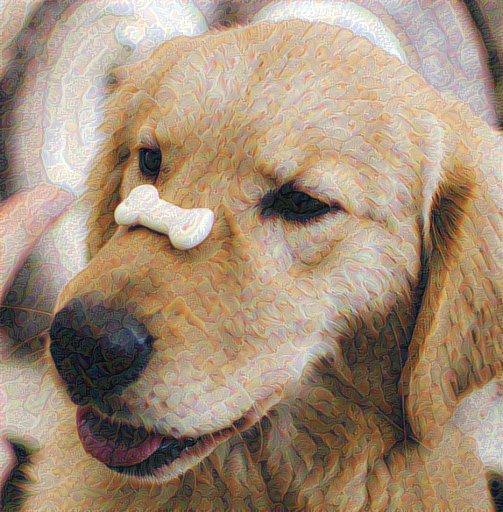

In [31]:
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

Since it's working, we can perform a longer optimization:

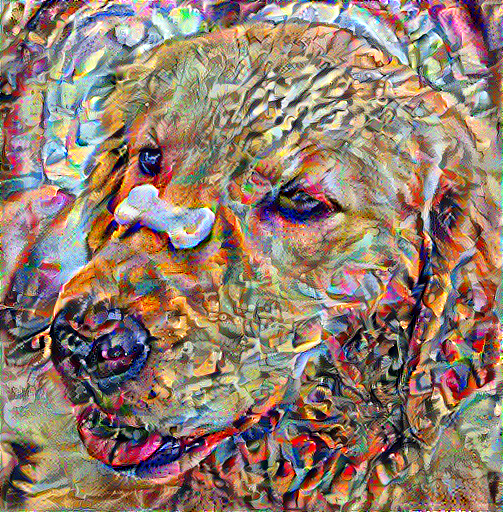

Train step: 1000
Total time: 27.1


In [32]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

## Total variation loss

One downside to our basic implementation is that it produces a lot of high frequency artifacts. We can decrease these using an explicit regularization term on the high frequency components of the image. In style transfer, this is often called the *total variation loss*:

In [33]:
def high_pass_x_y(image):
    x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
    y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

    return x_var, y_var

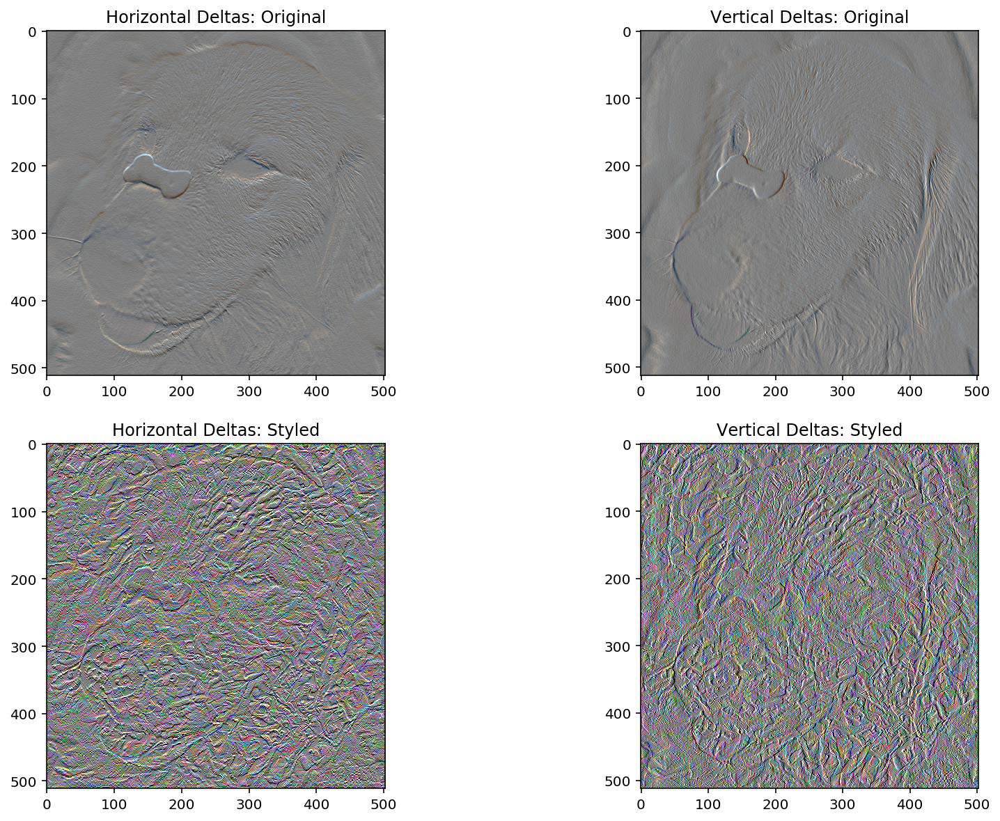

In [34]:
x_deltas, y_deltas = high_pass_x_y(content_image)

plt.figure(figsize=(14,10))
plt.subplot(2,2,1)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Original")

plt.subplot(2,2,2)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Original")

x_deltas, y_deltas = high_pass_x_y(image)

plt.subplot(2,2,3)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Styled")

plt.subplot(2,2,4)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Styled")

The above visualizations show how the high frequency components have been increased

Also, this high frequency component is basically an edge-detector. You can get similar output from the Sobel edge detector, for example:

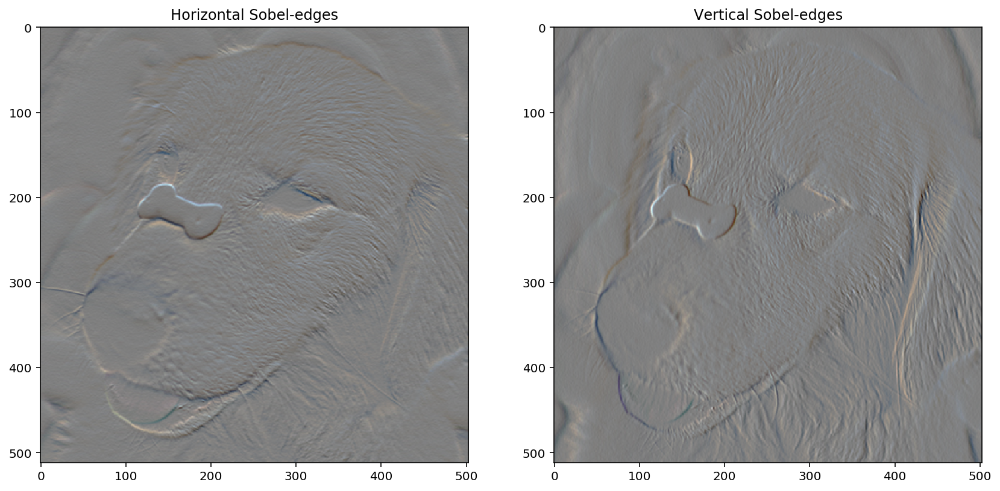

In [35]:
plt.figure(figsize=(14, 10))

sobel = tf.image.sobel_edges(content_image)
plt.subplot(1, 2, 1)
imshow(clip_0_1(sobel[..., 0]/4+0.5), "Horizontal Sobel-edges")
plt.subplot(1, 2, 2)
imshow(clip_0_1(sobel[..., 1]/4+0.5), "Vertical Sobel-edges")

The regularization loss associated with this is the sum of the squares of the values:

In [36]:
def total_variation_loss(image):
    x_deltas, y_deltas = high_pass_x_y(image)
    return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

In [37]:
total_variation_loss(image).numpy()

171996.53

That demonstrated what it does, however TensorFlow has a standard implementation:

In [38]:
tf.image.total_variation(image).numpy()

array([171996.53], dtype=float32)

## Re-run the optimization

We can choose a weight for the `total_variation_loss`:

In [39]:
total_variation_weight=30

Now include it in the `train_step` function:

In [40]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight*tf.image.total_variation(image)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

Reinitialize the optimization variable:

In [41]:
image = tf.Variable(content_image)

And run the optimization:

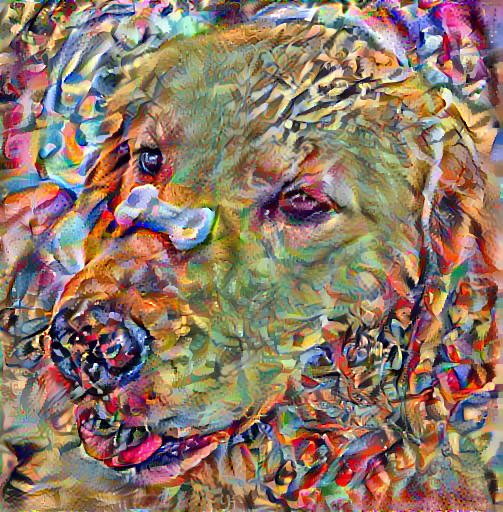

Train step: 1000
Total time: 28.3


In [42]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
    for m in range(steps_per_epoch):
        step += 1
        train_step(image)
        print(".", end='')
    display.clear_output(wait=True)
    display.display(tensor_to_image(image))
    print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

Which looks like we managed to transfer the style, if we compare this to our original images

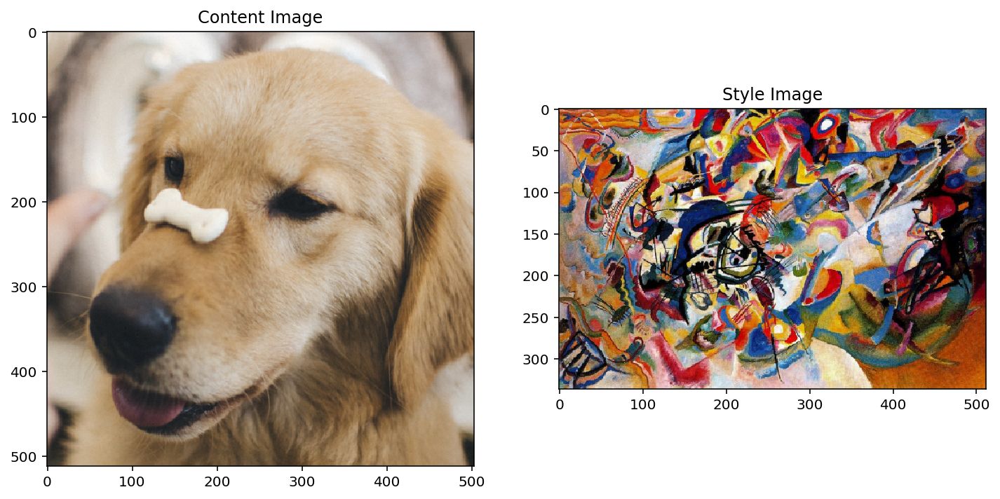

In [43]:
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')